In [1]:
import numpy as np
import nashpy as nash
import ipywidgets as widgets
from IPython.display import display

In [2]:
def computeNashEq(state, payoff_matrixA, payoff_matrixB):
    game = nash.Game(payoff_matrixA[state, :, :, 0], payoff_matrixB[state, :, :, 1])
    eqs = game.vertex_enumeration()
    try:
        eq = next(eqs)
        print(eq)
        return np.abs(eq)
    except Exception:
        a = 1
        b = 0
        return [[a, 1 - a], [b, 1 - b]]

In [56]:
def reward(state, player1_action, player2_action, payoffMatrix):
    return payoffMatrix[state, player1_action, player2_action]

In [57]:
def expectedPayoff(payoff_matrix, player1_strategy, player2_strategy):
    expected_payoff = np.dot(np.dot(player1_strategy, payoff_matrix), player2_strategy)
    return expected_payoff
    

In [5]:
def nashQlearning(n_players, q, alfa, gamma, epsilon, pure_training_ep, actions_per_player, transition_matrix, n_games, reward_matrix):
    #NashQ
    ALPHA = alfa
    GAMMA = gamma
    EPSILON = epsilon
    PURE_TRAINING_EPISODES = pure_training_ep
    TRANSITION_MATRIX = transition_matrix
    A = actions_per_player
    N = n_players
    Q = q
    
    qTables = [np.zeros((Q, A, A, N)) for _ in range(N)] #QTable for each player

    state = 0
    totalReward = [np.array([0, 0], dtype=float) for _ in range(N)]
    diffs = [[]for _ in range(N)]
    NashQRewards = [[]for _ in range(N)]
    NashEquilibria = [[]for _ in range(N)]
    nashEq = [np.array([0.5, 0.5]), np.array([0.5, 0.5])]

    gamesLoadingBarNashQ = widgets.IntProgress(
        value=0,
        min=0,
        max=n_games-1,
        step=1,
        description='Games:',
        bar_style='info',
    )

    display(gamesLoadingBarNashQ)

    playerLoadingBar = widgets.IntProgress(
        value=0,
        min=0,
        max=N-1,
        step=1,
        description='Players:',
        bar_style='info',
    )

    display(playerLoadingBar)

    for t in range(n_games):
        ALPHA = 1 / (t + 1 - PURE_TRAINING_EPISODES) if t >= PURE_TRAINING_EPISODES else ALPHA
        player1_action = np.random.choice(A, p=nashEq[0]) if np.random.rand() > EPSILON else np.random.choice(A)
        player2_action = np.random.choice(A, p=nashEq[1]) if np.random.rand() > EPSILON else np.random.choice(A)

        next_state = np.random.choice(range(Q), p=TRANSITION_MATRIX[player1_action, player2_action, state])

        r = reward(state, player1_action, player2_action, reward_matrix)
        for i in range(N):
            playerLoadingBar.value = i
            qTable = qTables[i]

            nashEq = np.abs(computeNashEq(state, qTable, qTable))

            NashEquilibria[i].append(nashEq)

            next_NashEq = computeNashEq(next_state, qTable, qTable)
            next_qVal_0 = expectedPayoff(qTable[next_state, :, :, 0], next_NashEq[0], next_NashEq[1])
            next_qVal_1 = expectedPayoff(qTable[next_state, :, :, 1], next_NashEq[0], next_NashEq[1])
            oldQ = qTable[state, player1_action, player2_action].copy()
            qTable[state, player1_action, player2_action, 0] = (1 - ALPHA) * qTable[state, player1_action, player2_action, 0] + ALPHA * (r[0] + GAMMA * next_qVal_0)
            qTable[state, player1_action, player2_action, 1] = (1 - ALPHA) * qTable[state, player1_action, player2_action, 1] + ALPHA * (r[1] + GAMMA * next_qVal_1)

            diffs[i].append(qTable[state, player1_action, player2_action] - oldQ)
            
            totalReward[i] += r
            NashQRewards[i].append(r)
            print(qTables[i])
        state = next_state
        gamesLoadingBarNashQ.value += 1
    return totalReward, diffs, NashQRewards, NashEquilibria



TestSet 1

In [76]:
Q_0 = 2 #Number of games
N_0 = 2 #Number of players
A_0 = 2 #Number of actions per player
n_games_0 = 10000 #number of repetitions

# Player1 action / Player2 action / starting state / ending state / probability
#Deterministic transition matrix
TRANSITION_MATRIX_0 = np.array(
    [
        # Player 1 - Action 0
        [
            # Player 2 - Action 0 
            [
                [0, 1],
                [0, 1]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0],
                [1, 0]
                
            ]
        ],

        # Player 1 - Action 1
        [
            # Player 2 - Action 0
            [
                
                [1, 0],
                [1, 0]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0],
                [1, 0]
                
            ]
        ]
    ]
)

# state / player1 action / player2 action / [player1 reward, player2 reward]
PAYOFF_MATRIX_0 = np.array([
    # State 0
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [-1, -1] ]
    ],
    # State 1
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [-1, -1] ]
    ]
])

TestSet 2

In [63]:
Q_1 = 2 #Number of games
N_1 = 2 #Number of players
A_1 = 2 #Number of actions per player
n_games_1 = 5000 #number of repetitions

# Player1 action / Player2 action / starting state / ending state / probability
#Deterministic transition matrix
TRANSITION_MATRIX_1 = np.array(
    [
        # Player 1 - Action 0
        [
            # Player 2 - Action 0 
            [
                [0, 1],
                [0, 1]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0],
                [1, 0]
                
            ]
        ],

        # Player 1 - Action 1
        [
            # Player 2 - Action 0
            [
                
                [1, 0],
                [1, 0]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0],
                [1, 0]
                
            ]
        ]
    ]
)

# state / player1 action / player2 action / [player1 reward, player2 reward]
PAYOFF_MATRIX_1 = np.array([
    # State 0
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    # State 1
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ]
])

TestSet 3

In [64]:
Q_2 = 3 #Number of games
N_2 = 2 #Number of players
A_2 = 2 #Number of actions per player
n_games_2 = 2000 #number of repetitions

# Player1 action / Player2 action / starting state / ending state / probability
#Deterministic transition matrix
TRANSITION_MATRIX_2 = np.array(
    [
        # Player 1 - Action 0
        [
            # Player 2 - Action 0 
            [
                [0, 1, 0],
                [0, 0, 1],
                [0, 0, 1]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0, 0],
                [0, 1, 0],
                [0, 1, 0]
                
            ]
        ],

        # Player 1 - Action 1
        [
            # Player 2 - Action 0
            [
                
                [1, 0, 0],
                [0, 1, 0],
                [0, 1, 0]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0, 0],
                [0, 1, 0],
                [1, 0, 0]
                
            ]
        ]
    ]
)

# state / player1 action / player2 action / [player1 reward, player2 reward]
PAYOFF_MATRIX_2 = np.array([
    # State 0
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [-1, -1] ]
    ],
    # State 1
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [-1, -1] ]
    ],
    # State 2
    [
        [ [1, 1], [0, 0] ],
        [ [0,0], [-2, -2] ]
    ]
])

TestSet 4

In [65]:
Q_3 = 8 #Number of games
N_3 = 2 #Number of players
A_3 = 2 #Number of actions per player
n_games_3 = 2000 #number of repetitions

# Player1 action / Player2 action / starting state / ending state / probability
#Deterministic transition matrix
TRANSITION_MATRIX_3 = np.array(
    [
        # Player 1 - Action 0
        [
            # Player 2 - Action 0 
            [
                [0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0]
            ],

            # Player 2 - Action 1
            [
                [0, 0, 0, 0, 0, 0, 1, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 0, 1, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 0, 1, 0],
                [0, 0, 0, 0, 0, 0, 1, 0]
            ]
        ],

        # Player 1 - Action 1
        [
            # Player 2 - Action 0
            [
                [0, 1, 0, 0, 0, 0, 0, 0],
                [0, 1, 0, 0, 0, 0, 0, 0],
                [0, 0, 1, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 1, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0]
            ],

            # Player 2 - Action 1
            
            [
                [0, 0, 0, 0, 0, 0, 1, 0],
                [0, 0, 1, 0, 0, 0, 0, 0],
                [0, 0, 1, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 1],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0],
                [1, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 1]
            ]
        ]
    ]
)

# state / player1 action / player2 action / [player1 reward, player2 reward]
PAYOFF_MATRIX_3 = np.array([
    # State 0
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    # State 1
    [
        [ [0, 0], [1, 1] ],
        [ [0, 0], [0, 0] ]
    ],
    # State 2
    [
        [ [1, 1], [1, 1] ],
        [ [0,0], [0, 0] ]
    ],
    #state 3
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 4
    [
        [ [0, 0], [1, 1] ],
        [ [0, 0], [1, 1] ]
    ],
    #state 5
    [
        [ [1, 1], [1, 1] ],
        [ [1, 1], [1, 1] ]
    ],
    #state 6
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 7
    [
        [ [1, 1], [0, 0] ],
        [ [1, 1], [0, 0] ]
    ]
])

TestSet 4 presents the following grid game:

–––––––––––––––––           S0: (0, 1)          action 0: up
|(3)  r1|(2)  r0|            1: (0, 2)          action 1: left
|goal   |       |            2: (0, 3)
–––––––––––––––––            3: (3, 1)          player 0: A
|(0)  r0|(1)  r0|            4: (3, 2)          player 1: B
|agent A|agent B|            5: (3, 3)
–––––––––––––––––            6: (0, 0)
.                            7: (3, 0)          two players can occupy the same cell, if trying to go into a wall they bounce back

TestSet 5

In [66]:
Q_4 = 16 #Number of games
N_4 = 2 #Number of players
A_4 = 2 #Number of actions per player
n_games_4 = 2000 #number of repetitions

# Player1 action / Player2 action / starting state / ending state / probability
#Deterministic transition matrix
TRANSITION_MATRIX_4 = np.array(
    [
        # Player 1 - Action 0
        [
            # Player 2 - Action 0 
            [
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

            ],

            # Player 2 - Action 1
            [
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
            ]
        ],

        # Player 1 - Action 1
        [
            # Player 2 - Action 0
            [
                #0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15
                [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],#0
                [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],#1
                [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#2
                [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#3
                [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#4
                [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#5
                [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#6
                [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#7
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],#8
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],#9
                [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],#10
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],#11
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],#12
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],#13
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],#14
                [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]#15
            ],

            # Player 2 - Action 1
            
            [
                #0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15
                [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#0
                [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#1
                [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],#2
                [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],#3
                [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#4
                [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#5
                [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#6
                [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],#7
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],#8
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],#9
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],#10
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],#11
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],#12
                [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],#13
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],#14
                [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]#15
            ]
        ]
    ]
)

# state / player1 action / player2 action / [player1 reward, player2 reward]
PAYOFF_MATRIX_4 = np.array([
    # State 0
    [
        [ [0.5, 0.5], [1, -0.1] ],
        [ [-0.1, 1], [0, 0] ]
    ],
    # State 1
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    # State 2
    [
        [ [1, -0.1], [0.5, 0.5] ],
        [ [0,0], [-0.1, 1] ]
    ],
    #state 3
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 4
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 5
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 6
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 7
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 8
    [
        [ [1, -0.1], [0, 0] ],
        [ [0.5, 0.5], [-0.1, 1] ]
    ],
    #state 9
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 10
    [
        [ [0, 0], [1, -0.1] ],
        [ [-0.1, 1], [0.5, 0.5] ]
    ],
    #state 11
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 12
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 13
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 14
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    #state 15
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ]
])

In [77]:
N=[N_0, N_1, N_2, N_3, N_4]
Q=[Q_0, Q_1, Q_2, Q_3, Q_4]
A=[A_0, A_1, A_2, A_3, A_4]
n_games=[n_games_0, n_games_1, n_games_2, n_games_3, n_games_4]
TRANSITION_MATRIX=[TRANSITION_MATRIX_0, TRANSITION_MATRIX_1, TRANSITION_MATRIX_2, TRANSITION_MATRIX_3, TRANSITION_MATRIX_4]
PAYOFF_MATRIX=[PAYOFF_MATRIX_0, PAYOFF_MATRIX_1, PAYOFF_MATRIX_2, PAYOFF_MATRIX_3, PAYOFF_MATRIX_4]

x = 0

In [168]:
#Simulate plays with nash policy
state = 0
totalReward = np.array([0, 0], dtype=float)
localNashRewards = []
EPSILON = 0.1

gamesLoadingBarLocalNash = widgets.IntProgress(
    value=0,
    min=0,
    max=n_games[x]-1,
    step=1,
    description='Games:',
    bar_style='info',
)

display(gamesLoadingBarLocalNash)

for _ in range(n_games[x]):
    print("State:", state)
    nashEq = computeNashEq(state, PAYOFF_MATRIX[x], PAYOFF_MATRIX[x])
    print("Nash equilibrium:", nashEq)
    player1_action = np.random.choice(A[x], p=nashEq[0]) if np.random.rand() > EPSILON else np.random.choice(A[x])
    player2_action = np.random.choice(A[x], p=nashEq[1]) if np.random.rand() > EPSILON else np.random.choice(A[x])
    print("Player 1 action:", player1_action)
    print("Player 2 action:", player2_action)
    next_state = np.random.choice(range(Q[x]), p=TRANSITION_MATRIX[x][player1_action, player2_action, state])
    print("Next state:", next_state)
    r = reward(state, player1_action, player2_action, PAYOFF_MATRIX[x])
    print("Reward:", r)
    state = next_state
    totalReward += r
    localNashRewards.append(r)
    gamesLoadingBarLocalNash.value += 1
print("Total reward:", totalReward/n_games[x])

IntProgress(value=0, bar_style='info', description='Games:', max=1999)

State: 0
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0

(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next state: 1
Reward: [1 1]
State: 1
(array([1., 0.]), array([1., 0.]))
Nash equilibrium: [[1. 0.]
 [1. 0.]]
Player 1 action: 0
Player 2 action: 0
Next sta

In [169]:
#apply nashQlearning
totalReward, diffs, NashQRewards, NashEquilibria = nashQlearning(N[x], Q[x], 0.5, 0.5, 0.1, 1500, A[x], TRANSITION_MATRIX[x], n_games[x], PAYOFF_MATRIX[x])

IntProgress(value=0, bar_style='info', description='Games:', max=1999)

IntProgress(value=0, bar_style='info', description='Players:', max=1)

[[[[0.5 0.5]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]


 [[[0.  0. ]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]]
[[[[0.5 0.5]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]


 [[[0.  0. ]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]]
(array([1., 0.]), array([1., 0.]))
[[[[0.5   0.5  ]
   [0.    0.   ]]

  [[0.    0.   ]
   [0.    0.   ]]]


 [[[0.    0.   ]
   [0.125 0.125]]

  [[0.    0.   ]
   [0.    0.   ]]]]
(array([1., 0.]), array([1., 0.]))
[[[[0.5   0.5  ]
   [0.    0.   ]]

  [[0.    0.   ]
   [0.    0.   ]]]


 [[[0.    0.   ]
   [0.125 0.125]]

  [[0.    0.   ]
   [0.    0.   ]]]]
(array([1., 0.]), array([1., 0.]))
(array([1., 0.]), array([1., 0.]))
[[[[0.5   0.5  ]
   [0.125 0.125]]

  [[0.    0.   ]
   [0.    0.   ]]]


 [[[0.    0.   ]
   [0.125 0.125]]

  [[0.    0.   ]
   [0.    0.   ]]]]
(array([1., 0.]), array([1., 0.]))


/Users/andre/Library/Python/3.9/lib/python/site-packages/nashpy/polytope/polytope.py:109: RuntimeWarning: divide by zero encountered in divide
  hs = HalfspaceIntersection(halfspaces, feasible_point)
/Users/andre/Library/Python/3.9/lib/python/site-packages/nashpy/polytope/polytope.py:109: RuntimeWarning: invalid value encountered in divide
  hs = HalfspaceIntersection(halfspaces, feasible_point)


(array([1., 0.]), array([1., 0.]))
[[[[0.5   0.5  ]
   [0.125 0.125]]

  [[0.    0.   ]
   [0.    0.   ]]]


 [[[0.    0.   ]
   [0.125 0.125]]

  [[0.    0.   ]
   [0.    0.   ]]]]
(array([1., 0.]), array([1., 0.]))
(array([1., 0.]), array([0., 1.]))
[[[[0.78125 0.78125]
   [0.125   0.125  ]]

  [[0.      0.     ]
   [0.      0.     ]]]


 [[[0.      0.     ]
   [0.125   0.125  ]]

  [[0.      0.     ]
   [0.      0.     ]]]]
(array([1., 0.]), array([1., 0.]))
(array([1., 0.]), array([0., 1.]))
[[[[0.78125 0.78125]
   [0.125   0.125  ]]

  [[0.      0.     ]
   [0.      0.     ]]]


 [[[0.      0.     ]
   [0.125   0.125  ]]

  [[0.      0.     ]
   [0.      0.     ]]]]
(array([1., 0.]), array([0., 1.]))
(array([1., 0.]), array([0., 1.]))
[[[[0.78125 0.78125]
   [0.125   0.125  ]]

  [[0.      0.     ]
   [0.      0.     ]]]


 [[[0.53125 0.53125]
   [0.125   0.125  ]]

  [[0.      0.     ]
   [0.      0.     ]]]]
(array([1., 0.]), array([0., 1.]))
(array([1., 0.]), array([0., 1.]))
[

(2000, 2)
(2000, 2)


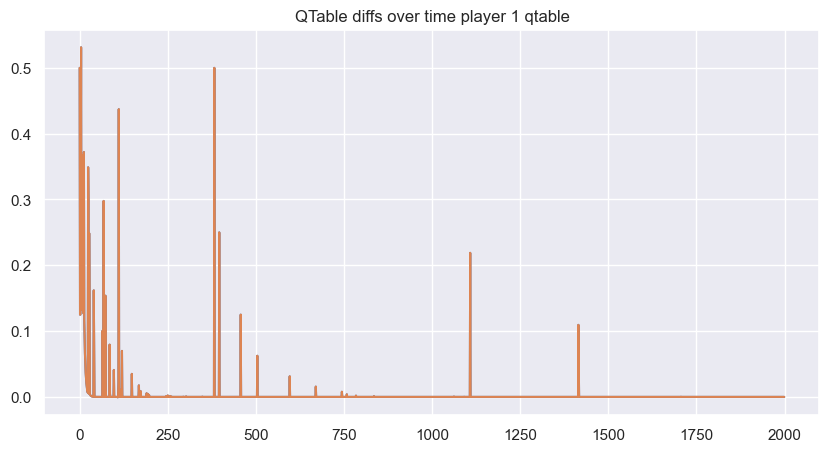

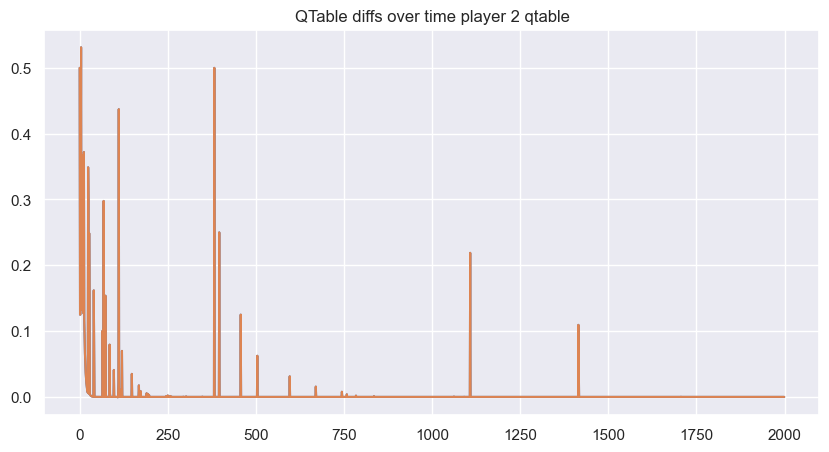

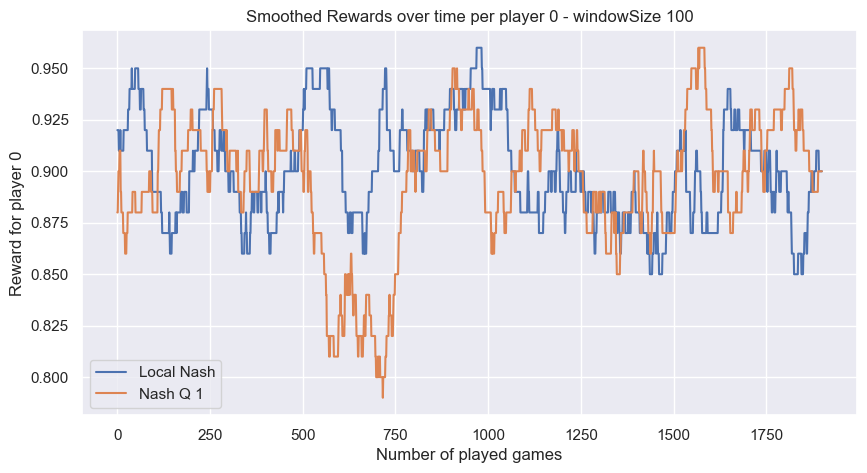

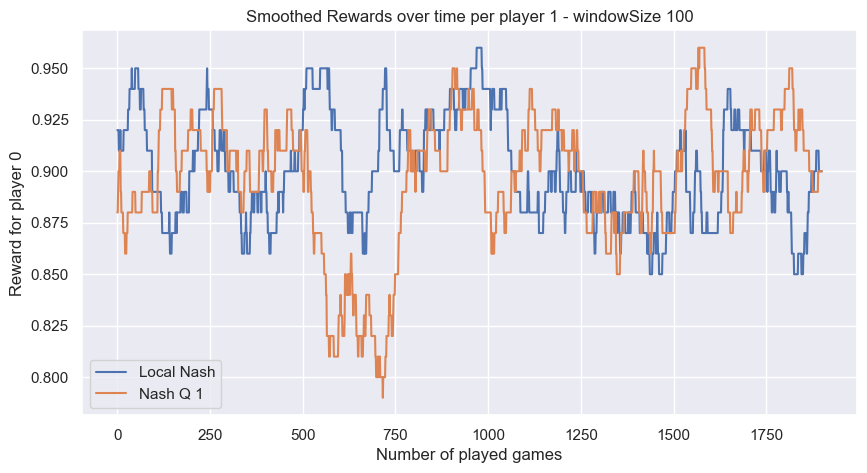

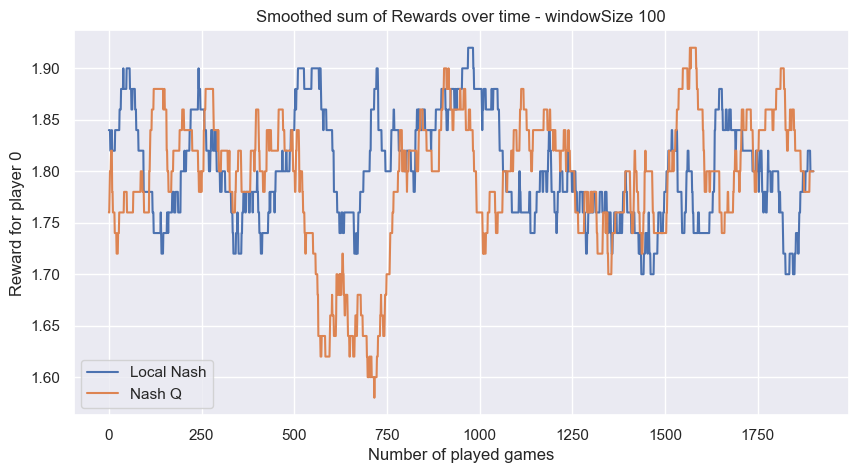

In [170]:
#plot the outcomes
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme()

for i in range(N[x]):
    diffs[i] = np.array(diffs[i])
    print(diffs[i].shape)
    diffs[i]
    NashQRewards[i] = np.array(NashQRewards[i])

localNashRewards = np.array(localNashRewards)
NashQRewards = np.array(NashQRewards)
diffs = np.array(diffs)

plt.figure(figsize=(10, 5))
plt.title("QTable diffs over time player 1 qtable")
for i in range(N[x]):
    sns.lineplot(data=diffs[i, :, 0])
plt.show()

plt.figure(figsize=(10, 5))
plt.title("QTable diffs over time player 2 qtable")
for i in range(N[x]):
    sns.lineplot(data=diffs[i, :, 1])
plt.show()

# smooth the data
window = 100

cumsum = np.cumsum(localNashRewards[:, 0])
cumsum[window:] = cumsum[window:] - cumsum[:-window]
localNashRewardsSmooth_0 = cumsum[window - 1:] / window

cumsum = np.cumsum(NashQRewards[0][:, 0])
cumsum[window:] = cumsum[window:] - cumsum[:-window]
NashQRewardsSmooth_0 = cumsum[window - 1:] / window

plt.figure(figsize=(10, 5))
plt.title(f"Smoothed Rewards over time per player 0 - windowSize {window}")
sns.lineplot(data=localNashRewardsSmooth_0, label="Local Nash")
sns.lineplot(data=NashQRewardsSmooth_0, label="Nash Q "+str(i))
#plt.ylim(0.5,1.2)
plt.xlabel("Number of played games")
plt.ylabel("Reward for player 0")
plt.show()

cumsum = np.cumsum(localNashRewards[:, 1])
cumsum[window:] = cumsum[window:] - cumsum[:-window]
localNashRewardsSmooth_1 = cumsum[window - 1:] / window

cumsum = np.cumsum(NashQRewards[0][:, 1])
cumsum[window:] = cumsum[window:] - cumsum[:-window]
NashQRewardsSmooth_1 = cumsum[window - 1:] / window


plt.figure(figsize=(10, 5))
plt.title(f"Smoothed Rewards over time per player 1 - windowSize {window}")
sns.lineplot(data=localNashRewardsSmooth_1, label="Local Nash")
sns.lineplot(data=NashQRewardsSmooth_1, label="Nash Q "+str(i))
#plt.ylim(0.5,1.2)
plt.xlabel("Number of played games")
plt.ylabel("Reward for player 0")
plt.show()

localNashRewardsSmooth_sum = localNashRewardsSmooth_0 + localNashRewardsSmooth_1
NashQRewardsSmooth_sum = NashQRewardsSmooth_0 + NashQRewardsSmooth_1

plt.figure(figsize=(10, 5))
plt.title(f"Smoothed sum of Rewards over time - windowSize {window}")
sns.lineplot(data=localNashRewardsSmooth_sum, label="Local Nash")
sns.lineplot(data=NashQRewardsSmooth_sum, label="Nash Q")
#plt.ylim(0.5,4)
plt.xlabel("Number of played games")
plt.ylabel("Reward for player 0")
plt.show()


In [171]:
rewardMatrix = np.array(
    [
        #Pl0 A0
        [
            #Pl1 A0
            [
                #Pl2 A0
                [1,1,1],
                #Pl2 A1
                [0,0,0]
            ],
            #Pl1 A1
            [
                #Pl2 A0
                [0,0,0],
                #Pl2 A1
                [-1,-1,-1]
            ]
        ],
        #Pl0 A1
        [
            #Pl1 A0
            [
                #Pl2 A0
                [0,0,0],
                #Pl2 A1
                [-1,-1,-1]
            ],
            #Pl1 A1
            [
                #Pl2 A0
                [-1,-1,-1],
                #Pl2 A1
                [-2,-2,-2]
            ]
        ]
    ])

In [172]:
game = nash.Game(rewardMatrix[:, :, :, 0], rewardMatrix[:, :, :, 1])
eqs = game.vertex_enumeration()
try:
    eq = next(eqs)
    print(np.abs(eq))
except Exception:
    a = 1
    b = 0
    print([[a, 1 - a], [b, 1 - b]])

[[1, 0], [0, 1]]


In [173]:
game = nash.Game(rewardMatrix[:, :, :, 1], rewardMatrix[:, :, :, 2])
eqs = game.vertex_enumeration()
try:
    eq = next(eqs)
    print(np.abs(eq))
except Exception:
    a = 1
    b = 0
    print([[a, 1 - a], [b, 1 - b]])

[[1, 0], [0, 1]]


In [174]:
foundEq =[]

game = nash.Game(rewardMatrix[0,:,:,1], rewardMatrix[0,:,:,2])
eqs = game.vertex_enumeration()
try:
    eq = next(eqs)
    print(np.abs(eq))
except Exception:
    a = 1
    b = 0
    print("exceptionnnn")

foundEq.append(eq)

game = nash.Game(rewardMatrix[1,:,:,1], rewardMatrix[1,:,:,2])

game = nash.Game(rewardMatrix[:,0,:,0], rewardMatrix[:,0,:,2])
game = nash.Game(rewardMatrix[:,1,:,0], rewardMatrix[:,1,:,2])
game = nash.Game(rewardMatrix[:,:,0,0], rewardMatrix[:,:,0,1])
game = nash.Game(rewardMatrix[:,:,1,0], rewardMatrix[:,:,1,1])

[[1. 0.]
 [1. 0.]]


In [18]:
import pygambit as pg

TRANSITION_MATRIX_1 = np.array(
    [
        # Player 1 - Action 0
        [
            # Player 2 - Action 0 
            [
                [0, 0],
                [0, 0]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0],
                [1, 0]
                
            ]
        ],

        # Player 1 - Action 1
        [
            # Player 2 - Action 0
            [
                
                [0, 0],
                [0, 0]
                
            ],

            # Player 2 - Action 1
            [
                
                [1, 0],
                [1, 0]
                
            ]
        ]
    ]
)
# playerX / state / player1 action / player2 action / playerX reward
PAYOFF_MATRIX_PL_1 = np.array([
    # State 0
    [
        [ 1, 0 ],
        [ 0, -1 ]
    ],
    # State 1
    [
        [ 3, 6 ],
        [ 4, 5 ]
    ]
])

PAYOFF_MATRIX_PL_2 = np.array([
    # State 0
    [
        [ 1, 0 ],
        [ 0, -1 ]
    ],
    # State 1
    [
        [ 4, 3 ],
        [ 5, 6 ]
    ]
])

# state / player1 action / player2 action / [player1 reward, player2 reward]
PAYOFF_MATRIX = np.array([
    # State 0
    [
        [ [0, 0], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ],
    # State 1
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ]
])

PAYOFF_MATRIX_3 = np.array([
    # State 0
    [
        [ [0, 1], [-2, 0] ],
        [ [-1, 0], [-2, -1] ]
    ]
])

def computeNashEq(state, payoff_matrix_plA, payoff_matrix_plB):
    game = pg.Game.from_arrays(payoff_matrix_plA[state], payoff_matrix_plB[state], title="random_test")
    
    eq = pg.nash.enummixed_solve(game).equilibria
    
    return eq

def approxNashEq(state, payoff_matrix_plA, payoff_matrix_plB, payoff_matrix_plC):
    game = pg.Game.from_arrays(payoff_matrix_plA[state], payoff_matrix_plB[state], payoff_matrix_plC[state], title="random_test")
    
    eq = pg.nash.logit_solve(game).equilibria
    
    return eq

In [12]:
eqs = computeNashEq(0, PAYOFF_MATRIX[:,:,:,0], PAYOFF_MATRIX[:,:,:,1])
for _ in eqs:
    print('rew for pl1: ' + str(_.payoff('1')))
    print('rew for pl2: '+str(_.payoff('2')))

    print(_.normalize())
    print(type(_))
    print("––––––––––––––––"*5)

print("––––––––––––––––"*5)

eqs_2 = computeNashEq(1, PAYOFF_MATRIX_PL_1, PAYOFF_MATRIX_PL_2)    

for _ in eqs_2:
    print('rew for pl1: ' + str(_.payoff('1')))
    print('rew for pl2: '+str(_.payoff('2')))

    print(_.normalize())
    print(type(_))
    print("––––––––––––––––"*5)

print("––––––––––––––––"*5)


e = [[[],[]],[[],[]]]
for i in range(2):
    for j in range(2):
        e[i][j].append(float(eqs_2[0][str(i+1)][str(j+1)]))

print(e)
print((eqs_2[0]['1']))
print(type(eqs_2[0]['1']))
print("––––––––––––––––"*5)
print("––––––––––––––––"*5)



rew for pl1: 0
rew for pl2: 0
[[Rational(1, 1), Rational(0, 1)], [Rational(1, 1), Rational(0, 1)]]
<class 'pygambit.gambit.MixedStrategyProfileRational'>
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––
rew for pl1: 0
rew for pl2: 0
[[Rational(1, 1), Rational(0, 1)], [Rational(0, 1), Rational(1, 1)]]
<class 'pygambit.gambit.MixedStrategyProfileRational'>
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––
rew for pl1: 0
rew for pl2: 0
[[Rational(0, 1), Rational(1, 1)], [Rational(1, 1), Rational(0, 1)]]
<class 'pygambit.gambit.MixedStrategyProfileRational'>
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––
rew for pl1: 0
rew for pl2: 0
[[Rational(0, 1), Rational(1, 1)], [Rational(0, 1), Rational(1, 1)]]
<class 'pygambit.gambit.MixedStrategyProfileRational'>
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

In [20]:
"""eqs_3 = approxNashEq(0, PAYOFF_MATRIX[:,:,:,0], PAYOFF_MATRIX[:,:,:,1])

for _ in eqs_3:
    print('rew for pl1: ' + str(_.payoff('1')))
    print('rew for pl2: '+str(_.payoff('2')))
    print(_.normalize())
    print(type(_)) 
    print("––––––––––––––––"*5)

print("––––––––––––––––"*5)"""

eqs_4 = approxNashEq(0, PAYOFF_MATRIX_3, PAYOFF_MATRIX_3, PAYOFF_MATRIX_3)

print(eqs_4)

for _ in eqs_4:
    print('rew for pl1: ' + str(_.payoff('1')))
    print('rew for pl2: '+str(_.payoff('2')))
    print(_.normalize())
    print(type(_))
    print("––––––––––––––––"*5)

[[[0.9999999824967039, 1.7503298606214026e-08], [0.9999999824967094, 1.7503293134260928e-08], [1.7503293134260928e-08, 0.9999999824967094]]]
rew for pl1: 0.9999999474901223
rew for pl2: 0.9999999474901223
[[0.9999999824967014, 1.7503298606213983e-08], [0.999999982496707, 1.7503293134260885e-08], [1.7503293134260885e-08, 0.999999982496707]]
<class 'pygambit.gambit.MixedStrategyProfileDouble'>
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––


In [59]:
def computeNashEq(state, payoff_matrix_plA, payoff_matrix_plB):
    game = pg.Game.from_arrays(payoff_matrix_plA[state,:,:,0], payoff_matrix_plB[state,:,:,0], title=("gambe number"+str(state)))
    
    eq = pg.nash.enummixed_solve(game).equilibria
    e = [[],[]]
    for i in range(2):
        for j in range(2):
            e[i].append(float(eq[0][str(i+1)][str(j+1)]))
    print(e)
    return e

In [61]:
PAYOFF_MATRIX = np.array([
    # State 0
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [-1, -1] ]
    ],
    # State 1
    [
        [ [1, 1], [0, 0] ],
        [ [0, 0], [0, 0] ]
    ]
])

eqs = computeNashEq(0, PAYOFF_MATRIX, PAYOFF_MATRIX)


[[1.0, 0.0], [1.0, 0.0]]


In [60]:
def nashQlearning(n_players, q, alfa, gamma, epsilon, decaying_epsilon, pure_training_ep, actions_per_player, transition_matrix, n_games, reward_matrix):
    #NashQ
    ALPHA = alfa
    GAMMA = gamma
    EPSILON = epsilon
    PURE_TRAINING_EPISODES = pure_training_ep
    TRANSITION_MATRIX = transition_matrix
    A = actions_per_player
    N = n_players
    Q = q
    
    qTables = [np.zeros((Q, A, A, N)) for _ in range(N)] #QTable for each player

    state = 0
    totalReward = [np.array([0, 0], dtype=float) for _ in range(N)]
    diffs = [[]for _ in range(N)]
    NashQRewards = [[]for _ in range(N)]
    NashEquilibria = [[]for _ in range(N)]
    nashEq = [np.array([0.5, 0.5]), np.array([0.5, 0.5])]

    gamesLoadingBarNashQ = widgets.IntProgress(
        value=0,
        min=0,
        max=n_games-1,
        step=1,
        description='Games:',
        bar_style='info',
    )

    display(gamesLoadingBarNashQ)

    playerLoadingBar = widgets.IntProgress(
        value=0,
        min=0,
        max=N-1,
        step=1,
        description='Players:',
        bar_style='info',
    )

    display(playerLoadingBar)

    for t in range(n_games):
        ALPHA = 1 / (t + 1 - PURE_TRAINING_EPISODES) if t >= PURE_TRAINING_EPISODES else ALPHA
        EPSILON = epsilon / (t + 1 - decaying_epsilon) if t >= decaying_epsilon else epsilon

        player1_action = np.random.choice(A, p=nashEq[0]) if np.random.rand() > EPSILON else np.random.choice(A)
        player2_action = np.random.choice(A, p=nashEq[1]) if np.random.rand() > EPSILON else np.random.choice(A)

        next_state = np.random.choice(range(Q), p=TRANSITION_MATRIX[player1_action, player2_action, state])

        r = reward(state, player1_action, player2_action, reward_matrix)
        for i in range(N):
            playerLoadingBar.value = i
            qTable = qTables[i]

            nashEq = np.abs(computeNashEq(state, qTable, qTable))

            NashEquilibria[i].append(nashEq)

            next_NashEq = computeNashEq(next_state, qTable, qTable)
            print("NashEq", next_NashEq)
            next_qVal_0 = expectedPayoff(qTable[next_state, :, :, 0], next_NashEq[0], next_NashEq[1])
            print("next_qVal_0", next_qVal_0)   
            next_qVal_1 = expectedPayoff(qTable[next_state, :, :, 1], next_NashEq[0], next_NashEq[1])
            print("next_qVal_1", next_qVal_1)
            oldQ = qTable[state, player1_action, player2_action].copy()
            qTable[state, player1_action, player2_action, 0] = (1 - ALPHA) * qTable[state, player1_action, player2_action, 0] + ALPHA * (r[0] + GAMMA * next_qVal_0)
            qTable[state, player1_action, player2_action, 1] = (1 - ALPHA) * qTable[state, player1_action, player2_action, 1] + ALPHA * (r[1] + GAMMA * next_qVal_1)

            diffs[i].append(qTable[state, player1_action, player2_action] - oldQ)
            
            totalReward[i] += r
            NashQRewards[i].append(r)
            print(qTables[i])
        state = next_state
        gamesLoadingBarNashQ.value += 1
    return totalReward, diffs, NashQRewards, NashEquilibria

In [78]:
totalReward, diffs, NashQRewards, NashEquilibria = nashQlearning(N[x], Q[x], 0.5, 0.5, 0.05, 30000, 9000, A[x], TRANSITION_MATRIX[x], n_games[x], PAYOFF_MATRIX[x])

IntProgress(value=0, bar_style='info', description='Games:', max=9999)

IntProgress(value=0, bar_style='info', description='Players:', max=1)

[[1.0, 0.0], [1.0, 0.0]]
[[1.0, 0.0], [1.0, 0.0]]
NashEq [[1.0, 0.0], [1.0, 0.0]]
next_qVal_0 0.0
next_qVal_1 0.0
[[[[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]]


 [[[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]]]
[[1.0, 0.0], [1.0, 0.0]]
[[1.0, 0.0], [1.0, 0.0]]
NashEq [[1.0, 0.0], [1.0, 0.0]]
next_qVal_0 0.0
next_qVal_1 0.0
[[[[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]]


 [[[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]]]
[[1.0, 0.0], [1.0, 0.0]]
[[1.0, 0.0], [1.0, 0.0]]
NashEq [[1.0, 0.0], [1.0, 0.0]]
next_qVal_0 0.0
next_qVal_1 0.0
[[[[0.5 0.5]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]


 [[[0.  0. ]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]]
[[1.0, 0.0], [1.0, 0.0]]
[[1.0, 0.0], [1.0, 0.0]]
NashEq [[1.0, 0.0], [1.0, 0.0]]
next_qVal_0 0.0
next_qVal_1 0.0
[[[[0.5 0.5]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]


 [[[0.  0. ]
   [0.  0. ]]

  [[0.  0. ]
   [0.  0. ]]]]
[[1.0, 0.0], [1.0, 0.0]]
[[1.0, 0.0], [1.0, 0.0]]
NashEq [[1.0, 0.0], [1.0, 0.0]]
next_qVal_0 0.0
next_qVal_1 0.0
[[

(10000, 2)
(10000, 2)


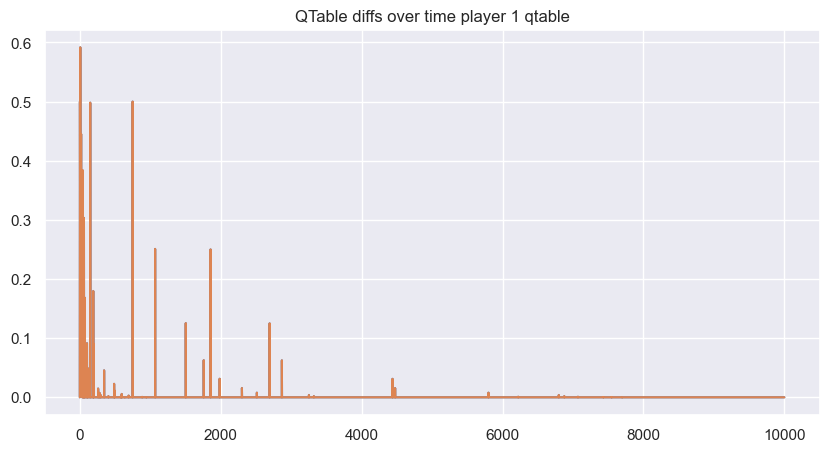

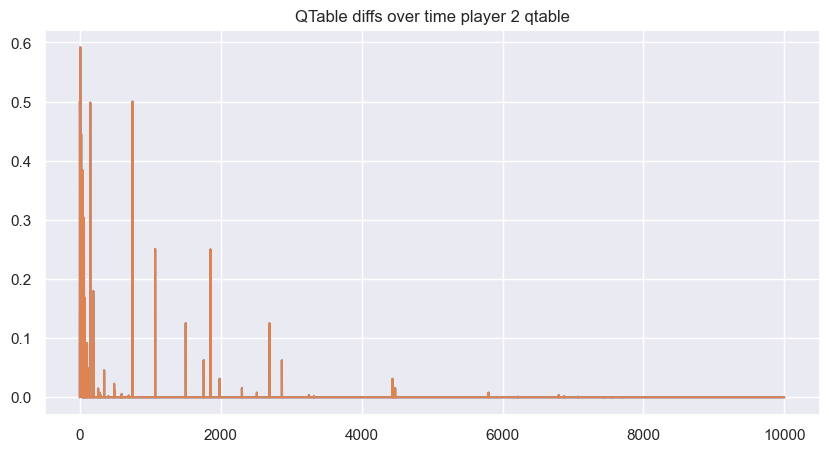

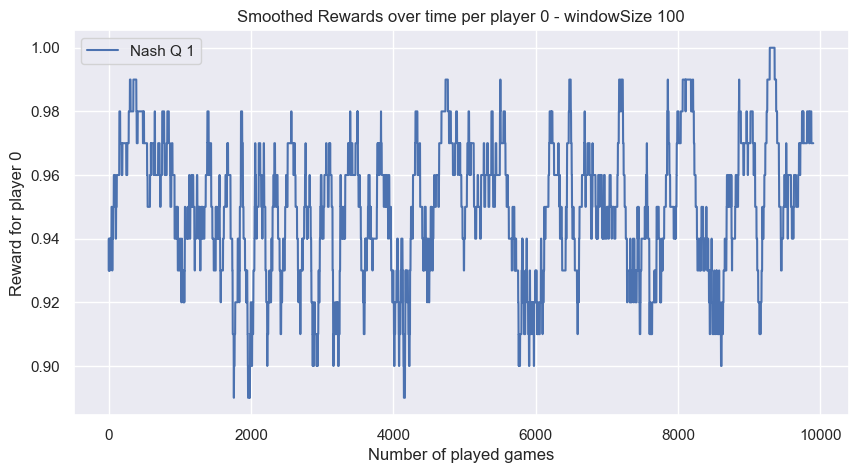

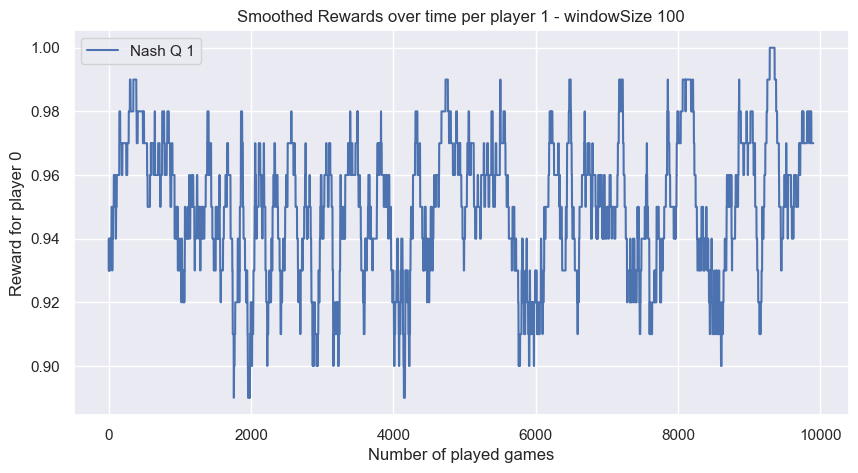

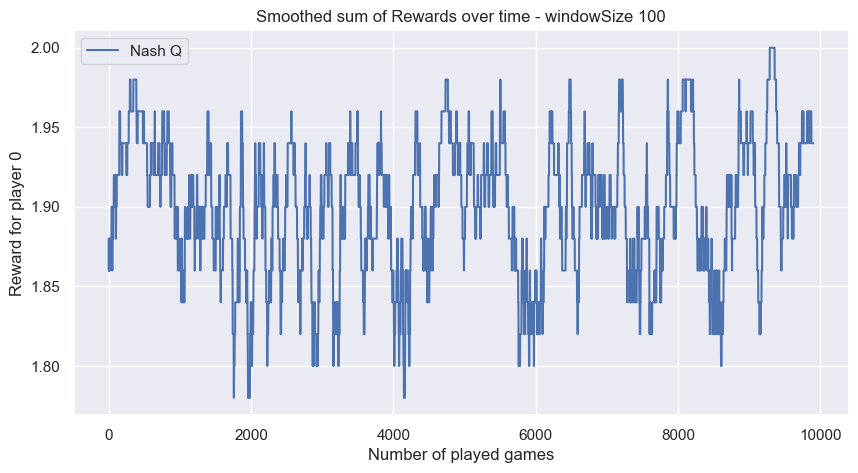

In [79]:
#plot the outcomes
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme()

for i in range(N[x]):
    diffs[i] = np.array(diffs[i])
    print(diffs[i].shape)
    diffs[i]
    NashQRewards[i] = np.array(NashQRewards[i])

#localNashRewards = np.array(localNashRewards)
NashQRewards = np.array(NashQRewards)
diffs = np.array(diffs)

plt.figure(figsize=(10, 5))
plt.title("QTable diffs over time player 1 qtable")
for i in range(N[x]):
    sns.lineplot(data=diffs[i, :, 0])
plt.show()

plt.figure(figsize=(10, 5))
plt.title("QTable diffs over time player 2 qtable")
for i in range(N[x]):
    sns.lineplot(data=diffs[i, :, 1])
plt.show()

# smooth the data
window = 100

#cumsum = np.cumsum(localNashRewards[:, 0])
#cumsum[window:] = cumsum[window:] - cumsum[:-window]
#localNashRewardsSmooth_0 = cumsum[window - 1:] / window

cumsum = np.cumsum(NashQRewards[0][:, 0])
cumsum[window:] = cumsum[window:] - cumsum[:-window]
NashQRewardsSmooth_0 = cumsum[window - 1:] / window

plt.figure(figsize=(10, 5))
plt.title(f"Smoothed Rewards over time per player 0 - windowSize {window}")
#sns.lineplot(data=localNashRewardsSmooth_0, label="Local Nash")
sns.lineplot(data=NashQRewardsSmooth_0, label="Nash Q "+str(i))
#plt.ylim(0.5,1.2)
plt.xlabel("Number of played games")
plt.ylabel("Reward for player 0")
plt.show()

#cumsum = np.cumsum(localNashRewards[:, 1])
#cumsum[window:] = cumsum[window:] - cumsum[:-window]
#localNashRewardsSmooth_1 = cumsum[window - 1:] / window

cumsum = np.cumsum(NashQRewards[0][:, 1])
cumsum[window:] = cumsum[window:] - cumsum[:-window]
NashQRewardsSmooth_1 = cumsum[window - 1:] / window


plt.figure(figsize=(10, 5))
plt.title(f"Smoothed Rewards over time per player 1 - windowSize {window}")
#sns.lineplot(data=localNashRewardsSmooth_1, label="Local Nash")
sns.lineplot(data=NashQRewardsSmooth_1, label="Nash Q "+str(i))
#plt.ylim(0.5,1.2)
plt.xlabel("Number of played games")
plt.ylabel("Reward for player 0")
plt.show()

#localNashRewardsSmooth_sum = localNashRewardsSmooth_0 + localNashRewardsSmooth_1
NashQRewardsSmooth_sum = NashQRewardsSmooth_0 + NashQRewardsSmooth_1

plt.figure(figsize=(10, 5))
plt.title(f"Smoothed sum of Rewards over time - windowSize {window}")
#sns.lineplot(data=localNashRewardsSmooth_sum, label="Local Nash")
sns.lineplot(data=NashQRewardsSmooth_sum, label="Nash Q")
#plt.ylim(0.5,4)
plt.xlabel("Number of played games")
plt.ylabel("Reward for player 0")
plt.show()

In [54]:
PAYOFF_MATRIX = np.array([
    # State 0
    [
        [ [[0,0,0], [1,1,1]], [[-2,-2,-2], [0,0,0]] ],
        [ [[-1,-1,-1], [-2,-2,-2]], [[0,0,0], [-1,-1,-1]] ]
    ]
])

np.shape(PAYOFF_MATRIX[0])

(2, 2, 2, 3)

In [50]:
def computeNashEq(state, payoff_matrixA, payoff_matrixB, payoff_matrixC):
        #create the game
        game = pg.Game.from_arrays(payoff_matrixA[state,:,:,:,0], payoff_matrixB[state,:,:,:,1], payoff_matrixC[state,:,:,:,2], title=("gambe number"+str(state)))
        #compute the Nash Equilibrium
        eq = pg.nash.logit_solve(game).equilibria
        #normalize the equilibrium
        eq = eq[0].normalize()
        print(eq)
        #convert the Nash Equilibrium to a list
        e = [[],[],[]]
        for i in range(3):
            for j in range(2):
                e[i].append(float(eq[str(i+1)][str(j+1)]))
        return e

In [51]:
computeNashEq(0, PAYOFF_MATRIX, PAYOFF_MATRIX, PAYOFF_MATRIX)

[[1.0, 2.561207948112245e-24], [0.9999999863180492, 1.3681950766153615e-08], [1.3681950766153618e-08, 0.9999999863180493]]


[[1.0, 2.561207948112245e-24],
 [0.9999999863180492, 1.3681950766153615e-08],
 [1.3681950766153618e-08, 0.9999999863180493]]